# Loading data into TS Fresh

Very useful documentation: https://tsfresh.readthedocs.io/en/latest/text/quick_start.html

In [1]:
from tsfresh import extract_relevant_features

# Data science trifecta
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Something to ensure that I can access the vnomics package
import sys
sys.path.insert(1, '../')

# If we package up our package formally we won't have to make the system path. This is how to keep yourself moving.

import vnomics

plt.style.use("ggplot")

Matt Mayo created the dataset we are working with using Vnomics util package to interact with the data source.

# Testing Out the Documentation Example

For a given robot, they have readings over

In [2]:
from tsfresh.examples.robot_execution_failures import download_robot_execution_failures, \
    load_robot_execution_failures
download_robot_execution_failures()
ts, y = load_robot_execution_failures()

In [3]:
ts[ts['id'] == 1]

,id,time,F_x,F_y,F_z,T_x,T_y,T_z
0,1,0,-1,-1,63,-3,-1,0
1,1,1,0,0,62,-3,-1,0
2,1,2,-1,-1,61,-3,0,0
3,1,3,-1,-1,63,-2,-1,0
4,1,4,-1,-1,63,-3,-1,0
5,1,5,-1,-1,63,-3,-1,0
6,1,6,-1,-1,63,-3,0,0
7,1,7,-1,-1,63,-3,-1,0
8,1,8,-1,-1,63,-3,-1,0
9,1,9,-1,-1,61,-3,0,0


In [4]:
y.index

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
            18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
            69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
            86, 87, 88],
           dtype='int64')

In [5]:
y.index[:1000]

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
            18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
            69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
            86, 87, 88],
           dtype='int64')

In [6]:
print(ts.head())

   id  time  F_x  F_y  F_z  T_x  T_y  T_z
0   1     0   -1   -1   63   -3   -1    0
1   1     1    0    0   62   -3   -1    0
2   1     2   -1   -1   61   -3    0    0
3   1     3   -1   -1   63   -2   -1    0
4   1     4   -1   -1   63   -3   -1    0


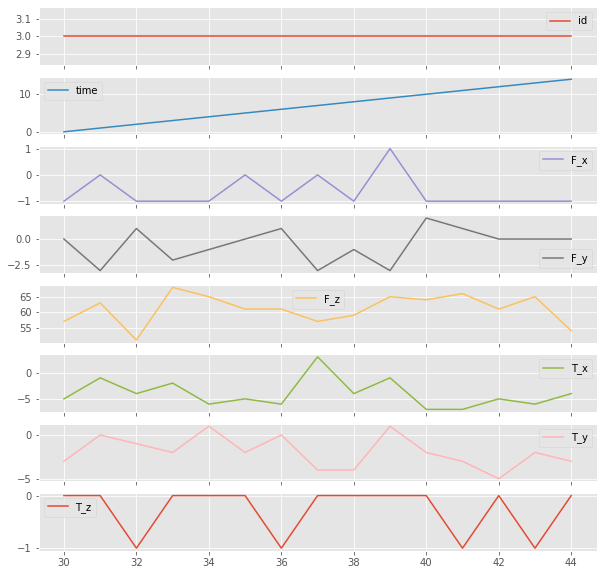

In [7]:
ts[ts['id'] == 3].plot(subplots=True, sharex=True, figsize=(10,10))
plt.show()

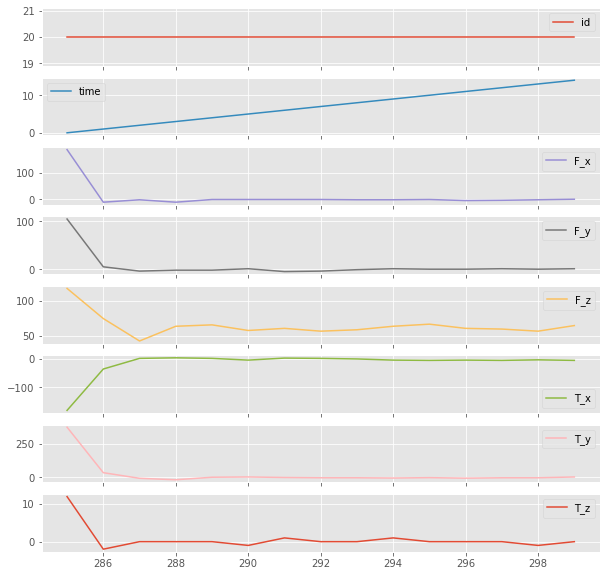

In [8]:
ts[ts['id'] == 20].plot(subplots=True, sharex=True, figsize=(10,10))
plt.show()

In [9]:
from tsfresh import extract_features
extracted_features = extract_features(ts, column_id="id", 
                                      column_sort="time")

Feature Extraction: 100%|██████████| 20/20 [00:05<00:00,  3.78it/s]


You end up with a DataFrame extracted_features with all **more than 1200 different extracted features**. We will now remove all NaN values (that were created by feature calculators, than can not be used on the given data, e.g. because it has too low statistics) and select only the relevant features next:

In [10]:
extracted_features.head()

,F_x__variance_larger_than_standard_deviation,F_x__has_duplicate_max,F_x__has_duplicate_min,F_x__has_duplicate,F_x__sum_values,F_x__abs_energy,F_x__mean_abs_change,F_x__mean_change,F_x__mean_second_derivative_central,F_x__median,...,T_z__permutation_entropy__dimension_5__tau_1,T_z__permutation_entropy__dimension_6__tau_1,T_z__permutation_entropy__dimension_7__tau_1,T_z__query_similarity_count__query_None__threshold_0.0,"T_z__matrix_profile__feature_""min""__threshold_0.98","T_z__matrix_profile__feature_""max""__threshold_0.98","T_z__matrix_profile__feature_""mean""__threshold_0.98","T_z__matrix_profile__feature_""median""__threshold_0.98","T_z__matrix_profile__feature_""25""__threshold_0.98","T_z__matrix_profile__feature_""75""__threshold_0.98"
1,0.0,0.0,1.0,1.0,-14.0,14.0,0.142857,0.000000,-0.038462,-1.0,...,-0.000000,-0.000000,-0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,1.0,1.0,1.0,-13.0,25.0,1.000000,0.000000,-0.038462,-1.0,...,1.540306,1.748067,1.831020,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,1.0,1.0,-10.0,12.0,0.714286,0.000000,-0.038462,-1.0,...,2.019815,2.163956,2.197225,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,1.0,1.0,1.0,-6.0,16.0,1.214286,-0.071429,-0.038462,0.0,...,2.397895,2.302585,2.197225,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.0,0.0,0.0,1.0,-9.0,17.0,0.928571,-0.071429,0.038462,-1.0,...,2.271869,2.302585,2.197225,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
from tsfresh import select_features
from tsfresh.utilities.dataframe_functions import impute

impute(extracted_features)
features_filtered = select_features(extracted_features, y)

/Users/mtaruno/opt/anaconda3/envs/vnomics/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:171: RuntimeWarning: The columns ['F_x__partial_autocorrelation__lag_7'
 'F_x__partial_autocorrelation__lag_8'
 'F_x__partial_autocorrelation__lag_9' ...
 'T_z__matrix_profile__feature_"median"__threshold_0.98'
 'T_z__matrix_profile__feature_"25"__threshold_0.98'
 'T_z__matrix_profile__feature_"75"__threshold_0.98'] did not have any finite values. Filling with zeros.
  warnings.warn("The columns {} did not have any finite values. Filling with zeros.".format(


In [12]:
features_filtered.head()

,F_x__value_count__value_-1,F_x__abs_energy,F_x__root_mean_square,F_x__range_count__max_1__min_-1,F_y__root_mean_square,F_y__abs_energy,T_y__standard_deviation,T_y__variance,"F_x__fft_coefficient__attr_""abs""__coeff_1","T_y__fft_coefficient__attr_""abs""__coeff_1",...,"T_x__change_quantiles__f_agg_""var""__isabs_True__qh_0.2__ql_0.0","F_z__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.8",T_x__quantile__q_0.1,F_y__has_duplicate_max,"F_y__cwt_coefficients__coeff_13__w_2__widths_(2, 5, 10, 20)","F_y__cwt_coefficients__coeff_14__w_5__widths_(2, 5, 10, 20)",T_y__quantile__q_0.1,F_z__time_reversal_asymmetry_statistic__lag_1,F_x__quantile__q_0.2,F_y__quantile__q_0.7
1,14.0,14.0,0.966092,15.0,0.930949,13.0,0.471405,0.222222,1.000000,1.165352,...,0.0,0.0,-3.0,1.0,-0.310265,-0.751682,-1.0,-596.000000,-1.0,-1.0
2,7.0,25.0,1.290994,13.0,2.250926,76.0,2.054805,4.222222,0.624118,6.020261,...,0.0,1.0,-9.2,1.0,-0.202951,0.057818,-3.6,-680.384615,-1.0,-1.0
3,11.0,12.0,0.894427,14.0,1.632993,40.0,1.768867,3.128889,2.203858,8.235442,...,0.0,3.0,-6.6,0.0,0.539121,0.912474,-4.0,-617.000000,-1.0,0.0
4,5.0,16.0,1.032796,10.0,2.000000,60.0,2.669998,7.128889,0.844394,12.067855,...,0.0,0.0,-9.0,0.0,-2.641390,-0.609735,-4.6,3426.307692,-1.0,1.0
5,9.0,17.0,1.064581,13.0,1.751190,46.0,2.039608,4.160000,2.730599,6.445330,...,0.0,0.0,-9.6,0.0,0.591927,0.072771,-5.0,-2609.000000,-1.0,0.8


# Applying it to Our Data

In [13]:
# Specifying beforehand the path to the data 
# folder (for reproducibility purposes)

path = '../data_2021/'

# Ingesting the data
daily = vnomics.read_daily()

In [14]:
daily.columns.tolist()

['date',
 'platform_id',
 'distance_miles',
 'fuel_used_gallons',
 'duration_mins',
 'idle_duration_mins',
 'fuel_loss_gallons',
 'dpf_regen_inhibited_duration_mins',
 'dpf_regen_not_inhibited_duration_mins',
 'dpf_regen_not_active_duration_mins',
 'dpf_regen_active_duration_mins',
 'dpf_regen_needed_duration_mins',
 'dpf_regen_inhibit_switch_not_active_duration_mins',
 'dpf_regen_inhibit_switch_active_duration_mins',
 'vehicle_serviced',
 'diagnostics_trouble_codes']

In [ ]:
['distance_miles','fuel_used_gallons','duration_mins','idle_duration_mins',
                      'fuel_loss_gallons','dpf_regen_inhibited_duration_mins','dpf_regen_not_inhibited_duration_mins',
                      'dpf_regen_not_active_duration_mins']

In [114]:
from sklearn.preprocessing import MinMaxScaler


def tsf_transform(raw_data):
    ''' Converting the raw daily data into a format that TS fresh can ingest
    
    Paramaters:
    -----------
    raw_data
    
    Returns:
    --------
    timeseries: X vector of features WITH a "time" column
    y: target column

    '''
    
    def normalize(v):
        ''' Normalize a column '''
        mx=v.max()
        mn=v.min()
        rng = mx-mn
        return v.apply(lambda x: (2*(x-mn)/rng)-1)
    
    # Trying with two platform IDs first
#     raw_data = raw_data[(raw_data['platform_id'] == 309450)|(raw_data['platform_id'] ==10321057)]
    
    # Adding a "time" column for the window with a double groupby 
    # (window function operation)
    raw_data['time'] = raw_data.groupby('platform_id')['date'].rank(method='min')
    
    # Subsetting into X and Target vectors
    y = raw_data.groupby('platform_id').sum()['vehicle_serviced']
    y = pd.Series([True if i == 1 else False for i in y], index = y.index)
    X = raw_data.drop('vehicle_serviced', axis = 1)
    
    
    # Transformations
    X['platform_id'] = X['platform_id'].astype(int)
    X['platform_id']= X['platform_id']
    X['time'] = X['time'].astype(int)
    
    # Subsetting
    mask = ['platform_id','time','duration_mins','dpf_regen_needed_duration_mins', 'idle_duration_mins',
            'fuel_used_gallons']
    X = X[mask]
    X.columns = ['id','time','F1','F2','F3','F4'] 
    
    f_set = ['F1','F2','F3','F4']
    o_set = ['id','time']
    
    # Normalizing
#     X['duration_mins']=normalize(X['duration_mins'])
#     X['dpf_regen_needed_duration_mins']=normalize(X['dpf_regen_needed_duration_mins'])
    scaler = MinMaxScaler()
    X_features = scaler.fit_transform(X[f_set])
    X_features = pd.DataFrame(X_features, columns = f_set )
    X = pd.concat([X[o_set],X[f_set]])
    return X, y

In [115]:
# Taking the windowed data
fullwindow = pd.read_csv(path + 'fullwindow_data.csv')
fullwindow.drop("Unnamed: 0", inplace = True, axis = 1)
fullwindow['date'] = pd.to_datetime(fullwindow['date'])
fullwindow.tail()

,date,platform_id,distance_miles,fuel_used_gallons,duration_mins,idle_duration_mins,fuel_loss_gallons,dpf_regen_inhibited_duration_mins,dpf_regen_not_inhibited_duration_mins,dpf_regen_not_active_duration_mins,dpf_regen_active_duration_mins,dpf_regen_needed_duration_mins,dpf_regen_inhibit_switch_not_active_duration_mins,dpf_regen_inhibit_switch_active_duration_mins,vehicle_serviced,diagnostics_trouble_codes
81643,2020-12-26,10321057,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0,[]
81644,2020-12-27,10321057,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0,[]
81645,2020-12-28,10321057,71.111881,10.254559,256.280633,61.143883,0.895138,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0,"[{'j1939': {'severity': 'unclassified', 'fmi':..."
81646,2020-12-29,10321057,89.829647,10.336130,260.439067,63.117833,0.670019,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0,"[{'j1939': {'severity': 'unclassified', 'fmi':..."
81647,2020-12-30,10321057,443.193080,64.188357,819.277567,112.323517,3.406284,0.0,3.382583,3.382583,0.0,0.0,0.0,0.0,0,"[{'j1939': {'severity': 'unclassified', 'fmi':..."


In [116]:
X, y = tsf_transform(fullwindow)

In [117]:
X

,id,time,F1,F2,F3,F4
0,309450.0,1.0,NaN,NaN,NaN,NaN
1,309450.0,2.0,NaN,NaN,NaN,NaN
2,309450.0,3.0,NaN,NaN,NaN,NaN
3,309450.0,4.0,NaN,NaN,NaN,NaN
4,309450.0,5.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
81643,NaN,NaN,0.000000,0.0,0.000000,0.000000
81644,NaN,NaN,0.000000,0.0,0.000000,0.000000
81645,NaN,NaN,256.280633,0.0,61.143883,10.254559
81646,NaN,NaN,260.439067,0.0,63.117833,10.336130


In [91]:
y

platform_id
300498      False
300547      False
300558      False
300681      False
300771      False
            ...  
10320957    False
10320987    False
10321025    False
10321057    False
10321243     True
Length: 112, dtype: bool

In [183]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1320 entries, 0 to 1319
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   id      1320 non-null   int64
 1   time    1320 non-null   int64
 2   F_x     1320 non-null   int64
 3   F_y     1320 non-null   int64
 4   F_z     1320 non-null   int64
 5   T_x     1320 non-null   int64
 6   T_y     1320 non-null   int64
 7   T_z     1320 non-null   int64
dtypes: int64(8)
memory usage: 82.6 KB


In [56]:
X

,id,time,F1,F2
0,309450,1,-0.853560,-1.000000
1,309450,2,-0.657505,-1.000000
2,309450,3,-0.766308,-0.916801
3,309450,4,-0.913487,-0.994724
4,309450,5,-1.000000,-1.000000
...,...,...,...,...
81643,10321057,725,-1.000000,-1.000000
81644,10321057,726,-1.000000,-1.000000
81645,10321057,727,-0.830949,-1.000000
81646,10321057,728,-0.828206,-1.000000


In [57]:
y

platform_id
300498      False
300547      False
300558      False
300681      False
300771      False
            ...  
10320957    False
10320987    False
10321025    False
10321057    False
10321243     True
Length: 112, dtype: bool

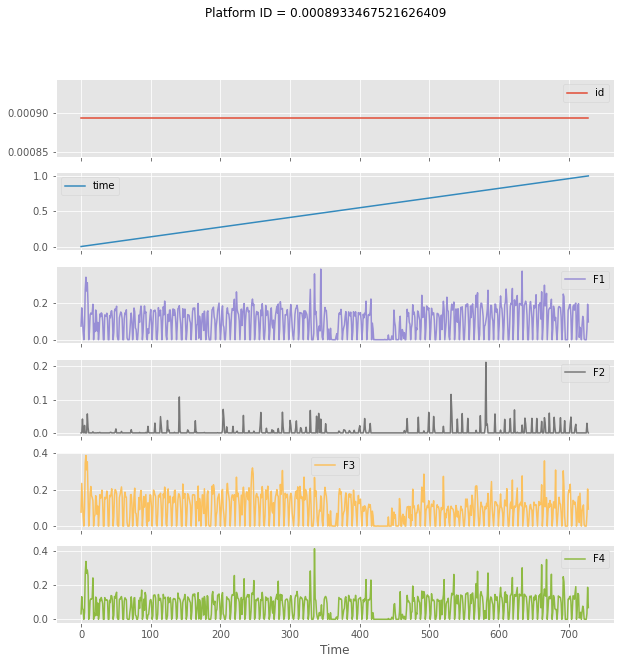

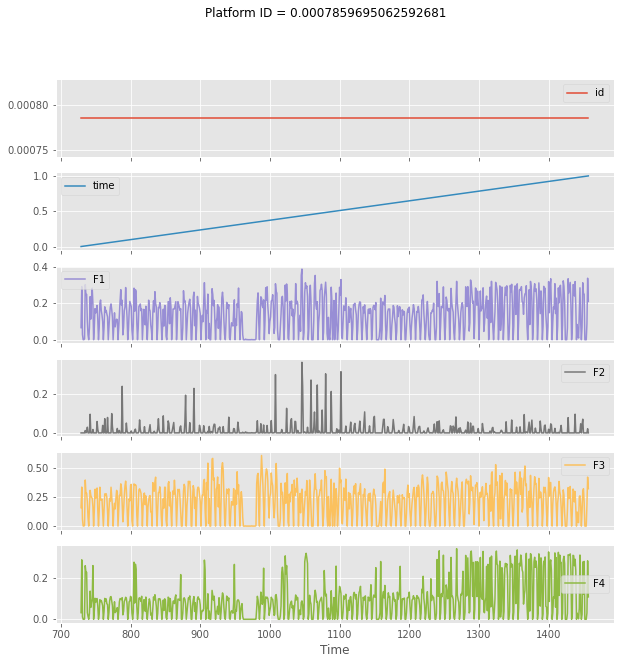

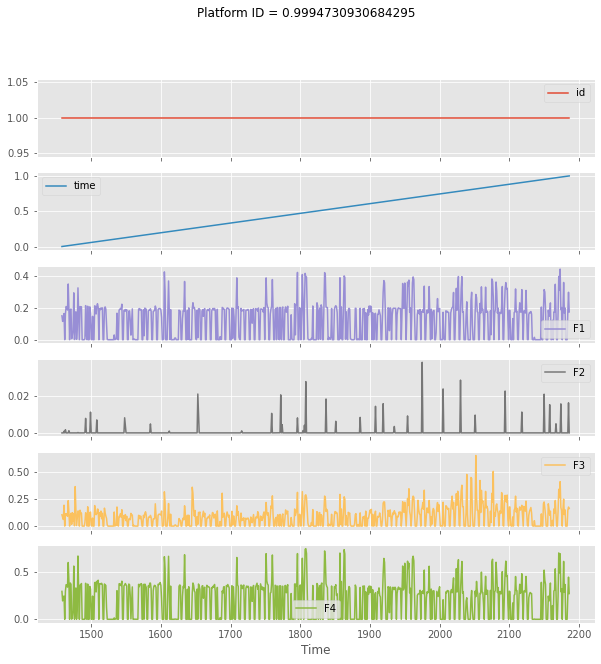

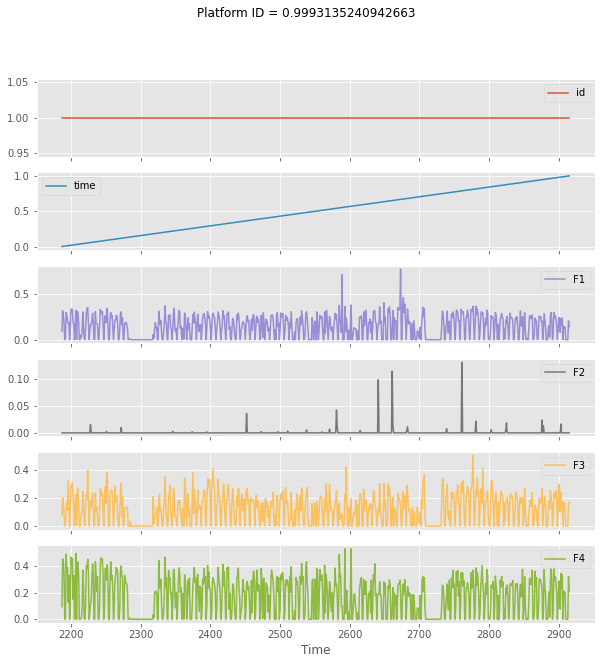

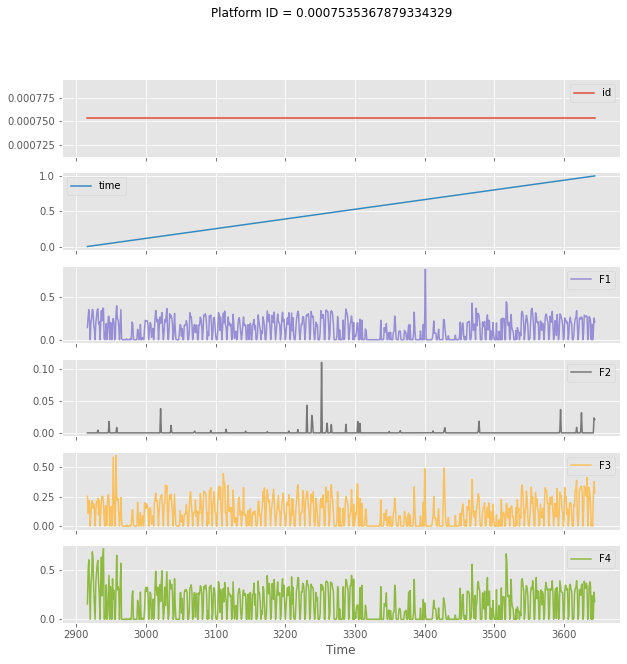

...

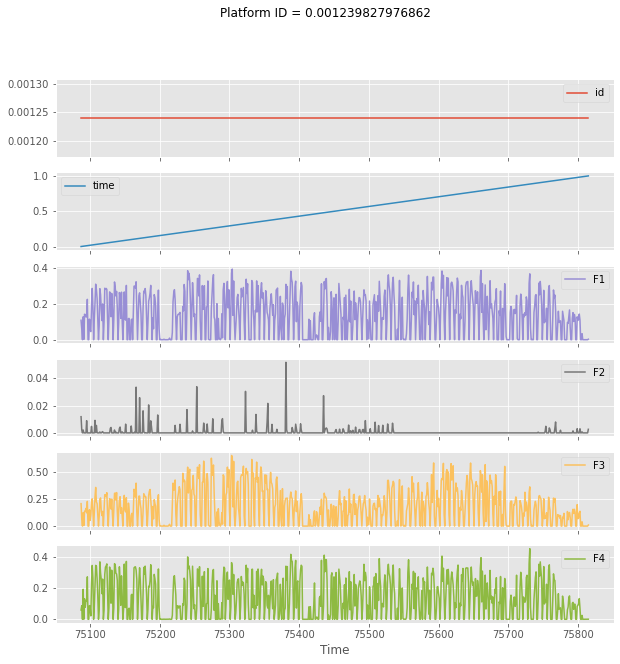

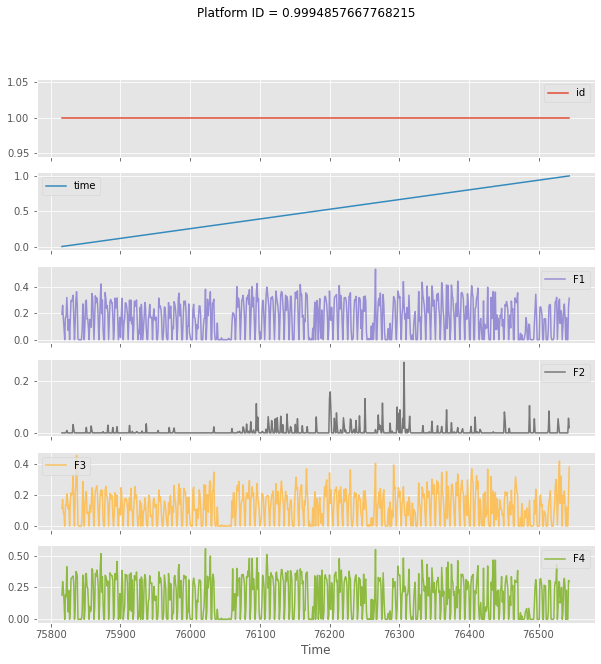

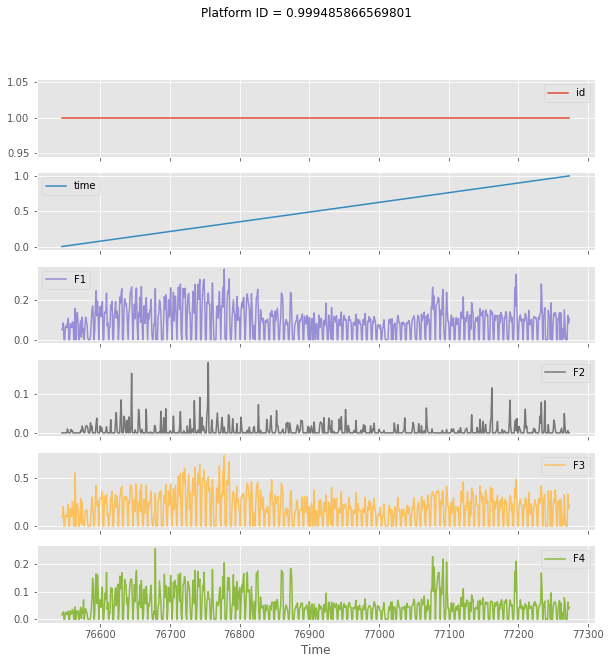

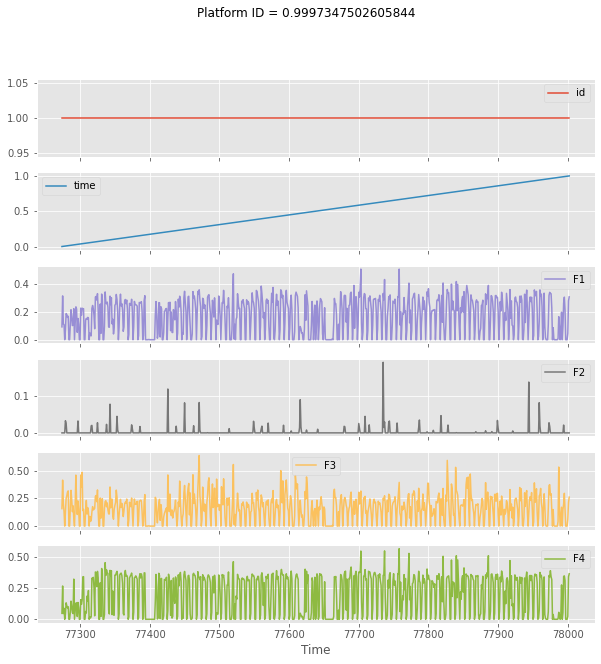

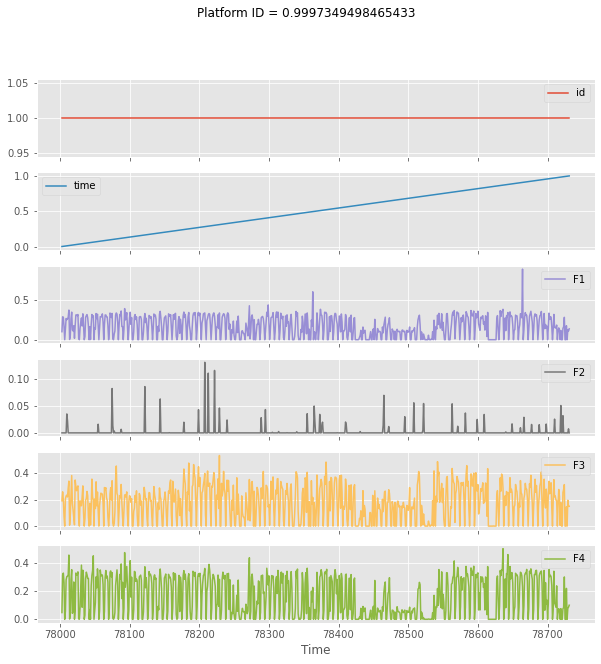

KeyboardInterrupt: 

In [97]:
for i in X['id'].unique():
    X[X['id'] == i].plot(subplots=True, sharex=True, figsize=(10,10), title = f"Platform ID = {i}", xlabel = "Time")
    plt.show()

In [98]:
extracted_features=extract_features(X, column_id="id", column_sort="time")

Feature Extraction: 100%|██████████| 20/20 [01:00<00:00,  3.02s/it]


In [99]:
extracted_features

,F1__variance_larger_than_standard_deviation,F1__has_duplicate_max,F1__has_duplicate_min,F1__has_duplicate,F1__sum_values,F1__abs_energy,F1__mean_abs_change,F1__mean_change,F1__mean_second_derivative_central,F1__median,...,F4__permutation_entropy__dimension_5__tau_1,F4__permutation_entropy__dimension_6__tau_1,F4__permutation_entropy__dimension_7__tau_1,F4__query_similarity_count__query_None__threshold_0.0,"F4__matrix_profile__feature_""min""__threshold_0.98","F4__matrix_profile__feature_""max""__threshold_0.98","F4__matrix_profile__feature_""mean""__threshold_0.98","F4__matrix_profile__feature_""median""__threshold_0.98","F4__matrix_profile__feature_""25""__threshold_0.98","F4__matrix_profile__feature_""75""__threshold_0.98"
0.000000,0.0,0.0,1.0,1.0,69.435313,14.651277,0.082784,0.000050,-0.000084,0.078642,...,4.436940,5.664513,6.313980,NaN,1.571968,5.241283,3.755496,3.916830,3.335140,4.325145
0.000005,0.0,0.0,1.0,1.0,73.546940,13.071801,0.068224,0.000073,-0.000168,0.099770,...,4.262334,5.390921,6.095598,NaN,0.911765,3.829274,2.524091,2.598860,2.087482,2.985572
0.000006,0.0,0.0,1.0,1.0,84.793717,17.718320,0.080446,0.000233,0.000046,0.138147,...,4.277424,5.446968,6.173451,NaN,1.061200,3.598820,2.165949,2.142057,1.770954,2.541438
0.000018,0.0,0.0,1.0,1.0,75.936112,14.560086,0.071702,0.000213,-0.000036,0.114587,...,4.070469,5.201447,5.937059,NaN,2.776970,8.000000,4.432382,4.373722,4.002535,4.710641
0.000027,0.0,0.0,1.0,1.0,64.826841,10.714184,0.066532,0.000066,0.000097,0.097381,...,4.270613,5.459338,6.208120,NaN,0.927037,3.245562,1.929499,1.975400,1.606639,2.252942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.999971,0.0,0.0,1.0,1.0,110.679357,26.405305,0.090244,0.000058,-0.000145,0.139760,...,4.295269,5.481495,6.234954,NaN,1.245226,4.899601,3.136494,3.101143,2.554342,3.700358
0.999974,0.0,0.0,1.0,1.0,148.831613,44.197860,0.123659,0.000119,-0.000095,0.212796,...,4.391790,5.627907,6.317657,NaN,0.876521,3.955941,2.414410,2.487972,2.008655,2.780865
0.999978,0.0,0.0,1.0,1.0,148.816634,43.419614,0.112908,-0.000043,-0.000295,0.249118,...,4.165752,5.320820,6.053560,NaN,1.313560,5.930944,3.666138,3.808128,2.916664,4.471185
0.999981,0.0,0.0,1.0,1.0,114.124516,29.907974,0.104052,0.000259,-0.000157,0.157834,...,4.221142,5.394430,6.154983,NaN,1.626893,5.196480,3.575453,3.597290,3.096525,4.033173


In [105]:
from tsfresh.utilities.dataframe_functions import impute

impute(extracted_features)

/Users/mtaruno/opt/anaconda3/envs/vnomics/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:171: RuntimeWarning: The columns ['F1__friedrich_coefficients__coeff_0__m_3__r_30'
 'F1__friedrich_coefficients__coeff_1__m_3__r_30'
 'F1__friedrich_coefficients__coeff_2__m_3__r_30'
 'F1__friedrich_coefficients__coeff_3__m_3__r_30'
 'F1__max_langevin_fixed_point__m_3__r_30'
 'F1__query_similarity_count__query_None__threshold_0.0'
 'F2__friedrich_coefficients__coeff_0__m_3__r_30'
 'F2__friedrich_coefficients__coeff_1__m_3__r_30'
 'F2__friedrich_coefficients__coeff_2__m_3__r_30'
 'F2__friedrich_coefficients__coeff_3__m_3__r_30'
 'F2__max_langevin_fixed_point__m_3__r_30'
 'F2__query_similarity_count__query_None__threshold_0.0'
 'F3__friedrich_coefficients__coeff_0__m_3__r_30'
 'F3__friedrich_coefficients__coeff_1__m_3__r_30'
 'F3__friedrich_coefficients__coeff_2__m_3__r_30'
 'F3__friedrich_coefficients__coeff_3__m_3__r_30'
 'F3__max_langevin_fixed_point__m_3__r_30'
 'F3__query_s

,F1__variance_larger_than_standard_deviation,F1__has_duplicate_max,F1__has_duplicate_min,F1__has_duplicate,F1__sum_values,F1__abs_energy,F1__mean_abs_change,F1__mean_change,F1__mean_second_derivative_central,F1__median,...,F4__permutation_entropy__dimension_5__tau_1,F4__permutation_entropy__dimension_6__tau_1,F4__permutation_entropy__dimension_7__tau_1,F4__query_similarity_count__query_None__threshold_0.0,"F4__matrix_profile__feature_""min""__threshold_0.98","F4__matrix_profile__feature_""max""__threshold_0.98","F4__matrix_profile__feature_""mean""__threshold_0.98","F4__matrix_profile__feature_""median""__threshold_0.98","F4__matrix_profile__feature_""25""__threshold_0.98","F4__matrix_profile__feature_""75""__threshold_0.98"
0.000000,0.0,0.0,1.0,1.0,69.435313,14.651277,0.082784,0.000050,-0.000084,0.078642,...,4.436940,5.664513,6.313980,0.0,1.571968,5.241283,3.755496,3.916830,3.335140,4.325145
0.000005,0.0,0.0,1.0,1.0,73.546940,13.071801,0.068224,0.000073,-0.000168,0.099770,...,4.262334,5.390921,6.095598,0.0,0.911765,3.829274,2.524091,2.598860,2.087482,2.985572
0.000006,0.0,0.0,1.0,1.0,84.793717,17.718320,0.080446,0.000233,0.000046,0.138147,...,4.277424,5.446968,6.173451,0.0,1.061200,3.598820,2.165949,2.142057,1.770954,2.541438
0.000018,0.0,0.0,1.0,1.0,75.936112,14.560086,0.071702,0.000213,-0.000036,0.114587,...,4.070469,5.201447,5.937059,0.0,2.776970,8.000000,4.432382,4.373722,4.002535,4.710641
0.000027,0.0,0.0,1.0,1.0,64.826841,10.714184,0.066532,0.000066,0.000097,0.097381,...,4.270613,5.459338,6.208120,0.0,0.927037,3.245562,1.929499,1.975400,1.606639,2.252942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.999971,0.0,0.0,1.0,1.0,110.679357,26.405305,0.090244,0.000058,-0.000145,0.139760,...,4.295269,5.481495,6.234954,0.0,1.245226,4.899601,3.136494,3.101143,2.554342,3.700358
0.999974,0.0,0.0,1.0,1.0,148.831613,44.197860,0.123659,0.000119,-0.000095,0.212796,...,4.391790,5.627907,6.317657,0.0,0.876521,3.955941,2.414410,2.487972,2.008655,2.780865
0.999978,0.0,0.0,1.0,1.0,148.816634,43.419614,0.112908,-0.000043,-0.000295,0.249118,...,4.165752,5.320820,6.053560,0.0,1.313560,5.930944,3.666138,3.808128,2.916664,4.471185
0.999981,0.0,0.0,1.0,1.0,114.124516,29.907974,0.104052,0.000259,-0.000157,0.157834,...,4.221142,5.394430,6.154983,0.0,1.626893,5.196480,3.575453,3.597290,3.096525,4.033173


In [106]:
extracted_features.head()

,F1__variance_larger_than_standard_deviation,F1__has_duplicate_max,F1__has_duplicate_min,F1__has_duplicate,F1__sum_values,F1__abs_energy,F1__mean_abs_change,F1__mean_change,F1__mean_second_derivative_central,F1__median,...,F4__permutation_entropy__dimension_5__tau_1,F4__permutation_entropy__dimension_6__tau_1,F4__permutation_entropy__dimension_7__tau_1,F4__query_similarity_count__query_None__threshold_0.0,"F4__matrix_profile__feature_""min""__threshold_0.98","F4__matrix_profile__feature_""max""__threshold_0.98","F4__matrix_profile__feature_""mean""__threshold_0.98","F4__matrix_profile__feature_""median""__threshold_0.98","F4__matrix_profile__feature_""25""__threshold_0.98","F4__matrix_profile__feature_""75""__threshold_0.98"
0.000000,0.0,0.0,1.0,1.0,69.435313,14.651277,0.082784,0.000050,-0.000084,0.078642,...,4.436940,5.664513,6.313980,0.0,1.571968,5.241283,3.755496,3.916830,3.335140,4.325145
0.000005,0.0,0.0,1.0,1.0,73.546940,13.071801,0.068224,0.000073,-0.000168,0.099770,...,4.262334,5.390921,6.095598,0.0,0.911765,3.829274,2.524091,2.598860,2.087482,2.985572
0.000006,0.0,0.0,1.0,1.0,84.793717,17.718320,0.080446,0.000233,0.000046,0.138147,...,4.277424,5.446968,6.173451,0.0,1.061200,3.598820,2.165949,2.142057,1.770954,2.541438
0.000018,0.0,0.0,1.0,1.0,75.936112,14.560086,0.071702,0.000213,-0.000036,0.114587,...,4.070469,5.201447,5.937059,0.0,2.776970,8.000000,4.432382,4.373722,4.002535,4.710641
0.000027,0.0,0.0,1.0,1.0,64.826841,10.714184,0.066532,0.000066,0.000097,0.097381,...,4.270613,5.459338,6.208120,0.0,0.927037,3.245562,1.929499,1.975400,1.606639,2.252942


In [107]:
extract_relevant_features = extract_relevant_features(X, y, column_id='id', column_sort='time')

TypeError: 'DataFrame' object is not callable

In [70]:
extract_relevant_features

""
300498
300547
300558
300681
300771
...
10320957
10320987
10321025
10321057


Look at these features with some EDA to convince myself why they might be good features for determining failure.

At that point you'll have a dataframe with just those features, then you're on the brink of being able to do the feature preparation for the autoencoder.

-> Keras - You take it from flat to a multidimensional tensor. It will produce 3D vector.



When you get the features out of TS Fresh, less is more! See what you can use it with a handful of the TS Fresh features and see what you do there. TS Fresh will rank it for you.